# 0.EDA  
了解数据整体情况  
找出数据中的异常与缺失值  
目标值的观察  
数据之间相关性, 目标值与数据之间相关性  
Train_data、Test_data


In [159]:
# 各种函数库
#coding:utf-8
#导入warnings包，利用过滤器来实现忽略警告语句。
import warnings
warnings.filterwarnings('ignore')
# 查看当前运行环境
import sys
print("当前运行环境：")
print(sys.executable)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
# 设置不显示科学计数
np.set_printoptions(suppress=True)
# 设置显示全部列
pd.set_option('display.max_columns', None)

当前运行环境：
/home/xyz/anaconda3/envs/ds/bin/python


In [160]:
# 自定义函数
# reduce_mem_usage 函数通过调整数据类型，帮助我们减少数据在内存中占用的空间
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() 
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() 
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df

## 0.1总览数据
info()与describe()

In [161]:
# 读取数据
# path = "./datalab/231784/"
path = "../dataSet/"
Train_data = pd.read_csv(path+'used_car_train_20200313.csv', sep=' ')
Test_data = pd.read_csv(path+'used_car_testA_20200313.csv', sep=' ')

In [162]:
Train_data.head()

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
0,0,736,20040402,30.0,6,1.0,0.0,0.0,60,12.5,0.0,1046,0,0,20160404,1850,43.357796,3.966344,0.050257,2.159744,1.143786,0.235676,0.101988,0.129549,0.022816,0.097462,-2.881803,2.804097,-2.420821,0.795292,0.914762
1,1,2262,20030301,40.0,1,2.0,0.0,0.0,0,15.0,-,4366,0,0,20160309,3600,45.305273,5.236112,0.137925,1.380657,-1.422165,0.264777,0.121004,0.135731,0.026597,0.020582,-4.900482,2.096338,-1.030483,-1.722674,0.245522
2,2,14874,20040403,115.0,15,1.0,0.0,0.0,163,12.5,0.0,2806,0,0,20160402,6222,45.978359,4.823792,1.319524,-0.998467,-0.996911,0.251410,0.114912,0.165147,0.062173,0.027075,-4.846749,1.803559,1.565330,-0.832687,-0.229963
3,3,71865,19960908,109.0,10,0.0,0.0,1.0,193,15.0,0.0,434,0,0,20160312,2400,45.687478,4.492574,-0.050616,0.883600,-2.228079,0.274293,0.110300,0.121964,0.033395,0.000000,-4.509599,1.285940,-0.501868,-2.438353,-0.478699
4,4,111080,20120103,110.0,5,1.0,0.0,0.0,68,5.0,0.0,6977,0,0,20160313,5200,44.383511,2.031433,0.572169,-1.571239,2.246088,0.228036,0.073205,0.091880,0.078819,0.121534,-1.896240,0.910783,0.931110,2.834518,1.923482


In [163]:
Test_data.head()

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
0,150000,66932,20111212,222.0,4,5.0,1.0,1.0,313,15.0,0.0,1440,0,0,20160329,49.593127,5.246568,1.001130,-4.122264,0.737532,0.264405,0.121800,0.070899,0.106558,0.078867,-7.050969,-0.854626,4.800151,0.620011,-3.664654
1,150001,174960,19990211,19.0,21,0.0,0.0,0.0,75,12.5,1.0,5419,0,0,20160404,42.395926,-3.253950,-1.753754,3.646605,-0.725597,0.261745,0.000000,0.096733,0.013705,0.052383,3.679418,-0.729039,-3.796107,-1.541230,-0.757055
2,150002,5356,20090304,82.0,21,0.0,0.0,0.0,109,7.0,0.0,5045,0,0,20160308,45.841370,4.704178,0.155391,-1.118443,-0.229160,0.260216,0.112081,0.078082,0.062078,0.050540,-4.926690,1.001106,0.826562,0.138226,0.754033
3,150003,50688,20100405,0.0,0,0.0,0.0,1.0,160,7.0,0.0,4023,0,0,20160325,46.440649,4.319155,0.428897,-2.037916,-0.234757,0.260466,0.106727,0.081146,0.075971,0.048268,-4.864637,0.505493,1.870379,0.366038,1.312775
4,150004,161428,19970703,26.0,14,2.0,0.0,0.0,75,15.0,0.0,3103,0,0,20160309,42.184604,-3.166234,-1.572058,2.604143,0.387498,0.250999,0.000000,0.077806,0.028600,0.081709,3.616475,-0.673236,-3.197685,-0.025678,-0.101290


In [164]:
# info()可以观察数据量, 各数据类型, 数据大体缺失值情况
# 通过看赛题介绍, 数据可以分为两类: 定性与定量
# 发现notRepairedDamage为object类型,这个比较奇特
print("train info:")
Train_data.info()
print("----"*20)
print("----"*20)
print("train info:")
Test_data.info()

train info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   SaleID             150000 non-null  int64  
 1   name               150000 non-null  int64  
 2   regDate            150000 non-null  int64  
 3   model              149999 non-null  float64
 4   brand              150000 non-null  int64  
 5   bodyType           145494 non-null  float64
 6   fuelType           141320 non-null  float64
 7   gearbox            144019 non-null  float64
 8   power              150000 non-null  int64  
 9   kilometer          150000 non-null  float64
 10  notRepairedDamage  150000 non-null  object 
 11  regionCode         150000 non-null  int64  
 12  seller             150000 non-null  int64  
 13  offerType          150000 non-null  int64  
 14  creatDate          150000 non-null  int64  
 15  price              150000 non-null  int

In [165]:
# 查看类型为object的数据
Train_data['notRepairedDamage'].head()

0    0.0
1      -
2    0.0
3    0.0
4    0.0
Name: notRepairedDamage, dtype: object

In [166]:
# seller和offerType值的类型单一,异常
# seller销售方：个体：0，非个体：1
# offerType报价类型：提供：0，请求：1
print("Train desc:")
Train_data.describe()

Train desc:


,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
count,150000.000000,150000.000000,1.500000e+05,149999.000000,150000.000000,145494.000000,141320.000000,144019.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.0,1.500000e+05,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,74999.500000,68349.172873,2.003417e+07,47.129021,8.052733,1.792369,0.375842,0.224943,119.316547,12.597160,2583.077267,0.000007,0.0,2.016033e+07,5923.327333,44.406268,-0.044809,0.080765,0.078833,0.017875,0.248204,0.044923,0.124692,0.058144,0.061996,-0.001000,0.009035,0.004813,0.000313,-0.000688
std,43301.414527,61103.875095,5.364988e+04,49.536040,7.864956,1.760640,0.548677,0.417546,177.168419,3.919576,1885.363218,0.002582,0.0,1.067328e+02,7501.998477,2.457548,3.641893,2.929618,2.026514,1.193661,0.045804,0.051743,0.201410,0.029186,0.035692,3.772386,3.286071,2.517478,1.288988,1.038685
min,0.000000,0.000000,1.991000e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.0,2.015062e+07,11.000000,30.451976,-4.295589,-4.470671,-7.275037,-4.364565,0.000000,0.000000,0.000000,0.000000,0.000000,-9.168192,-5.558207,-9.639552,-4.153899,-6.546556
25%,37499.750000,11156.000000,1.999091e+07,10.000000,1.000000,0.000000,0.000000,0.000000,75.000000,12.500000,1018.000000,0.000000,0.0,2.016031e+07,1300.000000,43.135799,-3.192349,-0.970671,-1.462580,-0.921191,0.243615,0.000038,0.062474,0.035334,0.033930,-3.722303,-1.951543,-1.871846,-1.057789,-0.437034
50%,74999.500000,51638.000000,2.003091e+07,30.000000,6.000000,1.000000,0.000000,0.000000,110.000000,15.000000,2196.000000,0.000000,0.0,2.016032e+07,3250.000000,44.610266,-3.052671,-0.382947,0.099722,-0.075910,0.257798,0.000812,0.095866,0.057014,0.058484,1.624076,-0.358053,-0.130753,-0.036245,0.141246
75%,112499.250000,118841.250000,2.007111e+07,66.000000,13.000000,3.000000,1.000000,0.000000,150.000000,15.000000,3843.000000,0.000000,0.0,2.016033e+07,7700.000000,46.004721,4.000670,0.241335,1.565838,0.868758,0.265297,0.102009,0.125243,0.079382,0.087491,2.844357,1.255022,1.776933,0.942813,0.680378
max,149999.000000,196812.000000,2.015121e+07,247.000000,39.000000,7.000000,6.000000,1.000000,19312.000000,15.000000,8120.000000,1.000000,0.0,2.016041e+07,99999.000000,52.304178,7.320308,19.035496,9.854702,6.829352,0.291838,0.151420,1.404936,0.160791,0.222787,12.357011,18.819042,13.847792,11.147669,8.658418


In [167]:
# Test数据集同样异常seller和offerType
print("Test desc:")
Test_data.describe()

Test desc:


,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,regionCode,seller,offerType,creatDate,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
count,50000.000000,50000.000000,5.000000e+04,50000.000000,50000.000000,48587.000000,47107.000000,48090.000000,50000.000000,50000.000000,50000.000000,50000.0,50000.0,5.000000e+04,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,174999.500000,68542.223280,2.003393e+07,46.844520,8.056240,1.782185,0.373405,0.224350,119.883620,12.595580,2590.604820,0.0,0.0,2.016033e+07,44.418233,-0.037238,0.050534,0.084640,0.015001,0.248669,0.045021,0.122744,0.057997,0.062000,-0.017855,-0.013742,-0.013554,-0.003147,0.001516
std,14433.901067,61052.808133,5.368870e+04,49.469548,7.819477,1.760736,0.546442,0.417158,185.097387,3.908979,1876.970263,0.0,0.0,7.951521e+01,2.429950,3.642562,2.856341,2.026510,1.193026,0.044601,0.051766,0.195972,0.029211,0.035653,3.747985,3.231258,2.515962,1.286597,1.027360
min,150000.000000,0.000000,1.991000e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.0,0.0,2.015061e+07,28.987024,-4.137733,-4.205728,-5.638184,-4.287718,0.000000,0.000000,0.000000,0.000000,0.000000,-9.160049,-5.411964,-8.916949,-4.123333,-6.112667
25%,162499.750000,11203.500000,1.999091e+07,10.000000,1.000000,0.000000,0.000000,0.000000,75.000000,12.500000,1030.000000,0.0,0.0,2.016031e+07,43.139621,-3.191909,-0.971266,-1.453453,-0.928089,0.243762,0.000044,0.062644,0.035084,0.033714,-3.700121,-1.971325,-1.876703,-1.060428,-0.437920
50%,174999.500000,52248.500000,2.003091e+07,29.000000,6.000000,1.000000,0.000000,0.000000,109.000000,15.000000,2219.000000,0.0,0.0,2.016032e+07,44.611084,-3.050756,-0.388117,0.097881,-0.070225,0.257877,0.000815,0.095828,0.057084,0.058764,1.613212,-0.355843,-0.142779,-0.035956,0.138799
75%,187499.250000,118856.500000,2.007110e+07,65.000000,13.000000,3.000000,1.000000,0.000000,150.000000,15.000000,3857.000000,0.0,0.0,2.016033e+07,45.992639,3.997323,0.240548,1.562700,0.863731,0.265328,0.102025,0.125438,0.079077,0.087489,2.832708,1.262914,1.764335,0.941469,0.681163
max,199999.000000,196805.000000,2.015121e+07,246.000000,39.000000,7.000000,6.000000,1.000000,20000.000000,15.000000,8121.000000,0.0,0.0,2.016041e+07,51.751684,7.553517,18.394570,9.381599,5.270150,0.291618,0.153265,1.358813,0.156355,0.214775,12.338872,18.856218,12.950498,5.913273,2.624622


## 0.2缺失值与异常值

In [168]:
# train缺失值:bodyType, fuelType, gearbox
Train_data.isnull().sum()

SaleID                  0
name                    0
regDate                 0
model                   1
brand                   0
bodyType             4506
fuelType             8680
gearbox              5981
power                   0
kilometer               0
notRepairedDamage       0
regionCode              0
seller                  0
offerType               0
creatDate               0
price                   0
v_0                     0
v_1                     0
v_2                     0
v_3                     0
v_4                     0
v_5                     0
v_6                     0
v_7                     0
v_8                     0
v_9                     0
v_10                    0
v_11                    0
v_12                    0
v_13                    0
v_14                    0
dtype: int64

In [169]:
# Test缺失值:bodyType, fuelType, gearbox
Test_data.isnull().sum()

SaleID                  0
name                    0
regDate                 0
model                   0
brand                   0
bodyType             1413
fuelType             2893
gearbox              1910
power                   0
kilometer               0
notRepairedDamage       0
regionCode              0
seller                  0
offerType               0
creatDate               0
v_0                     0
v_1                     0
v_2                     0
v_3                     0
v_4                     0
v_5                     0
v_6                     0
v_7                     0
v_8                     0
v_9                     0
v_10                    0
v_11                    0
v_12                    0
v_13                    0
v_14                    0
dtype: int64

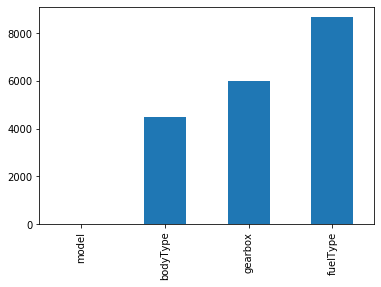

In [170]:
# 缺失值可视化1
miss_train = Train_data.isnull().sum() 
miss_train = miss_train[miss_train>0]
miss_train.sort_values(inplace=True)
miss_train.plot.bar()

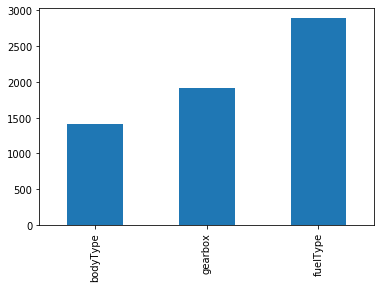

In [171]:
miss_test  =  Test_data.isnull().sum()
miss_test  =  miss_test[miss_test>0]
miss_test.sort_values(inplace=True)
miss_test.plot.bar()

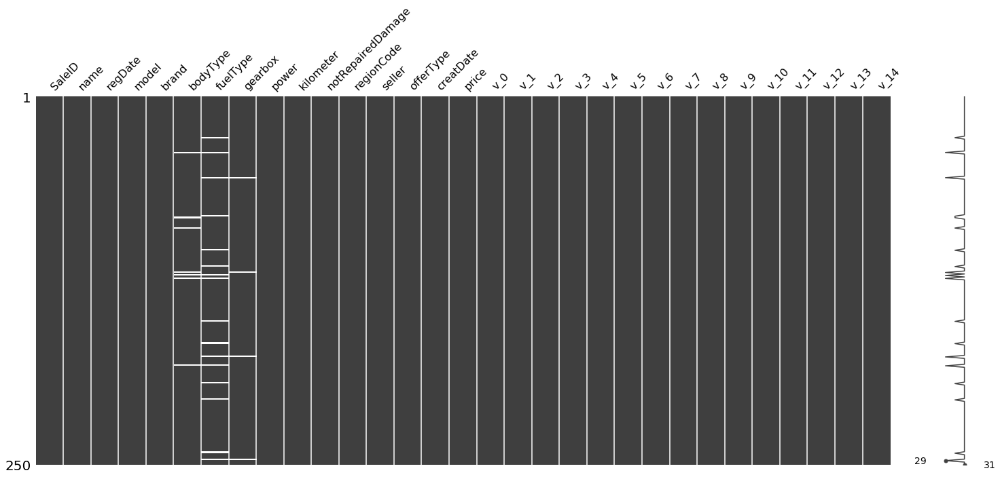

In [172]:
# 缺失值可视化2
# missingno库使用
msno.matrix(Train_data.sample(250))

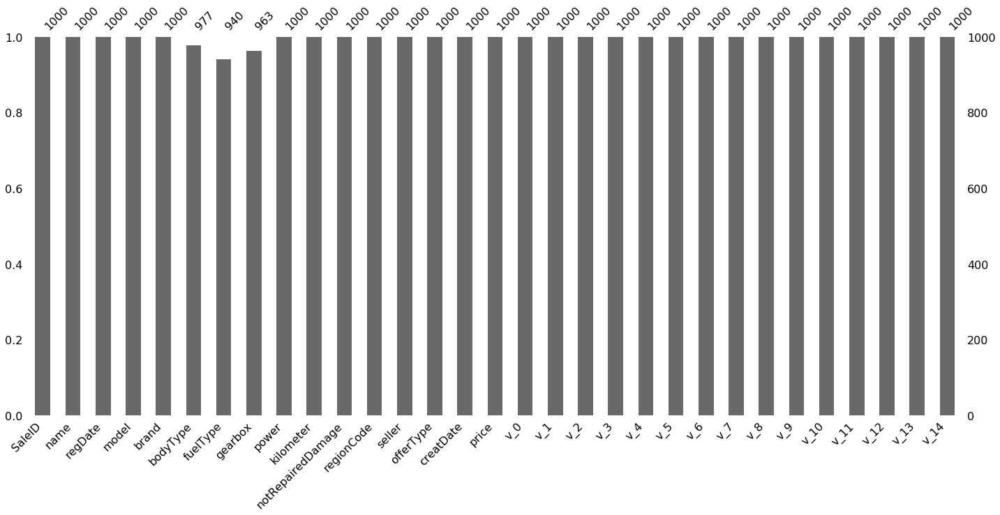

In [173]:
msno.bar(Train_data.sample(1000))

## 0.3预测值观察  
分布情况  
skewness（偏度）与kurtosis（峰度）

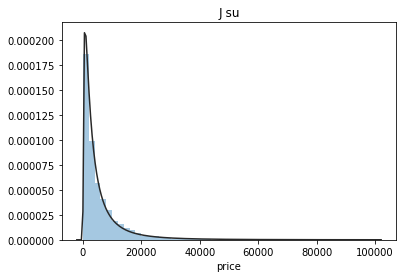

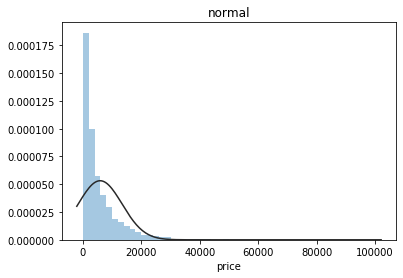

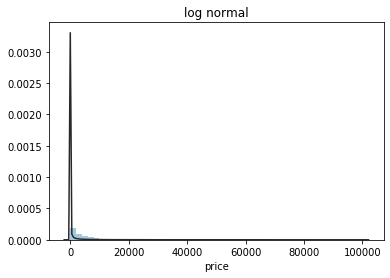

In [174]:
# 预测值是存在偏斜的,需要正太化处理
import scipy.stats as st
y = Train_data['price']
plt.figure(1);plt.title('J su')
sns.distplot(y,kde=False,fit=st.johnsonsu)
plt.figure(2);plt.title('normal')
sns.distplot(y,kde=False,fit=st.norm)
plt.figure(3);plt.title('log normal')
sns.distplot(y,kde=False,fit=st.lognorm)

skew: 3.346487
kurt: 18.995183


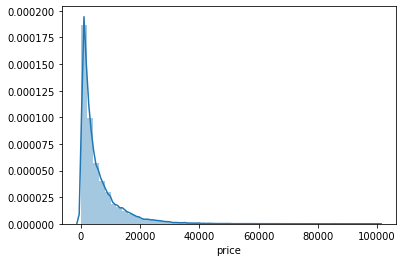

In [175]:
# sns.distplot——直方图和核密度函数
# https://www.jianshu.com/p/844f66d00ac1
sns.distplot(y)
print("skew: %f" % y.skew())
print("kurt: %f" % y.kurt())

skew:
SaleID          0.000000
name            0.557606
regDate         0.028495
model           1.484388
brand           1.150760
bodyType        0.991530
fuelType        1.595486
gearbox         1.317514
power          65.863178
kilometer      -1.525921
regionCode      0.688881
seller        387.298335
offerType       0.000000
creatDate     -79.013310
price           3.346487
v_0            -1.316712
v_1             0.359454
v_2             4.842556
v_3             0.106292
v_4             0.367989
v_5            -4.737094
v_6             0.368073
v_7             5.130233
v_8             0.204613
v_9             0.419501
v_10            0.025220
v_11            3.029146
v_12            0.365358
v_13            0.267915
v_14           -1.186355
dtype: float64


--------------------------------------------------------------------------------
kurt:
SaleID            -1.200000
name              -1.039945
regDate           -0.697308
model              1.740483
brand              1.076201


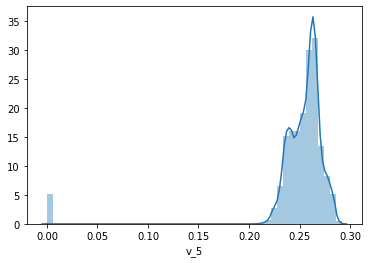

In [176]:
# 其他数据的偏度与
print("skew:")
a = Train_data.skew()
print(a)
print("\n")
print("----"*20)
print("kurt:")
b = Train_data.kurt()
print(b)
sns.distplot(Train_data['v_5'])

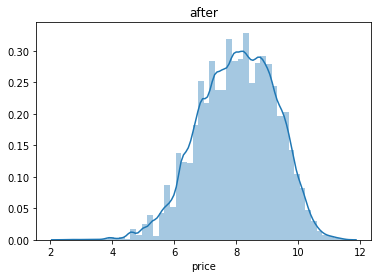

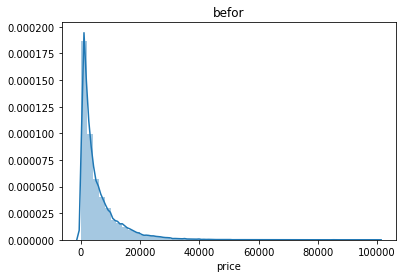

In [177]:
# 给预测值做log转换,查看分布情况
y_lg = np.log(y)
plt.figure(1);plt.title('after')
sns.distplot(y_lg)
plt.figure(2);plt.title('befor')
sns.distplot(y)

## 0.4各数据分析 

In [178]:
# 全部列信息
all_columns = Train_data.columns
all_columns

Index(['SaleID', 'name', 'regDate', 'model', 'brand', 'bodyType', 'fuelType',
       'gearbox', 'power', 'kilometer', 'notRepairedDamage', 'regionCode',
       'seller', 'offerType', 'creatDate', 'price', 'v_0', 'v_1', 'v_2', 'v_3',
       'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10', 'v_11', 'v_12',
       'v_13', 'v_14'],
      dtype='object')

In [179]:
# categorical_features为定性数据
categorical_features = ['name', 'model', 'brand', 'bodyType', 'fuelType', 'gearbox', 'notRepairedDamage', 'regionCode']
# numeric_features为定量数据
numeric_features = ['power', 'kilometer', 'v_0', 'v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10', 'v_11', 'v_12', 'v_13','v_14' ]

上面数据分类未包含regDate、creatDate、seller、offerType、price字段

### 0.4.a数据unique分布

name的特征分布如下：
name特征有个99662不同的值
708     282
387     282
55      280
1541    263
203     233
53      221
713     217
290     197
1186    184
911     182
2044    176
1513    160
1180    158
631     157
893     153
Name: name, dtype: int64


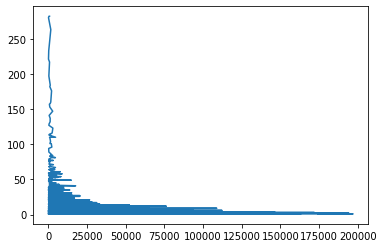

model的特征分布如下：
model特征有个248不同的值
0.0     11762
19.0     9573
4.0      8445
1.0      6038
29.0     5186
48.0     5052
40.0     4502
26.0     4496
8.0      4391
31.0     3827
13.0     3762
17.0     3121
65.0     2730
49.0     2608
46.0     2454
Name: model, dtype: int64


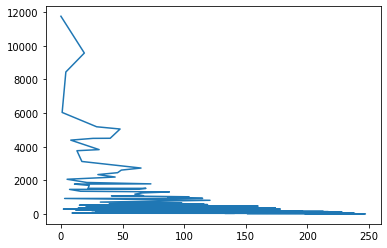

brand的特征分布如下：
brand特征有个40不同的值
0     31480
4     16737
14    16089
10    14249
1     13794
6     10217
9      7306
5      4665
13     3817
11     2945
3      2461
7      2361
16     2223
8      2077
25     2064
Name: brand, dtype: int64


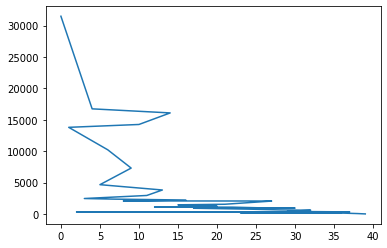

bodyType的特征分布如下：
bodyType特征有个8不同的值
0.0    41420
1.0    35272
2.0    30324
3.0    13491
4.0     9609
5.0     7607
6.0     6482
7.0     1289
Name: bodyType, dtype: int64


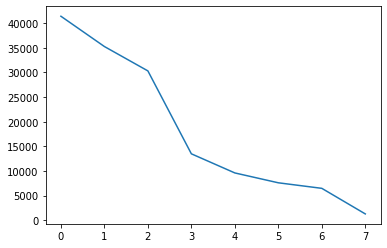

fuelType的特征分布如下：
fuelType特征有个7不同的值
0.0    91656
1.0    46991
2.0     2212
3.0      262
4.0      118
5.0       45
6.0       36
Name: fuelType, dtype: int64


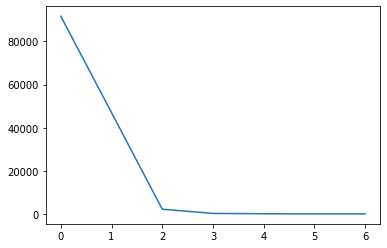

gearbox的特征分布如下：
gearbox特征有个2不同的值
0.0    111623
1.0     32396
Name: gearbox, dtype: int64


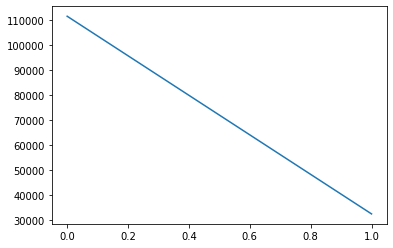

notRepairedDamage的特征分布如下：
notRepairedDamage特征有个3不同的值
0.0    111361
-       24324
1.0     14315
Name: notRepairedDamage, dtype: int64


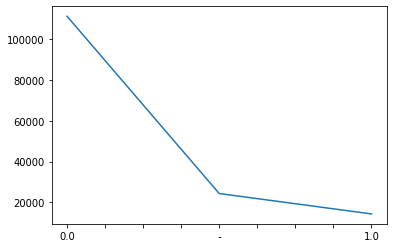

regionCode的特征分布如下：
regionCode特征有个7905不同的值
419     369
764     258
125     137
176     136
462     134
428     132
24      130
1184    130
122     129
828     126
70      125
827     120
207     118
1222    117
2418    117
Name: regionCode, dtype: int64


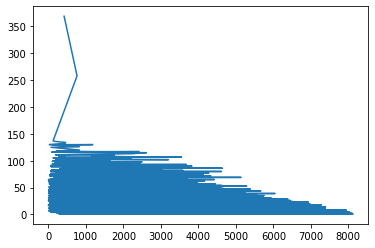

In [180]:
# 定性数据unique分布
for cat_fea in categorical_features:
    print(cat_fea + "的特征分布如下：")
    print("{}特征有个{}不同的值".format(cat_fea, Train_data[cat_fea].nunique()))
    print(Train_data[cat_fea].value_counts().head(15))
    Train_data[cat_fea].value_counts().plot()
    plt.show()


power的特征分布如下：
power特征有个566不同的值
0      12829
75      9593
150     6495
60      6374
140     5963
101     5537
116     5177
90      4890
170     4791
105     4457
125     2956
136     2813
163     2746
102     2714
143     2435
Name: power, dtype: int64


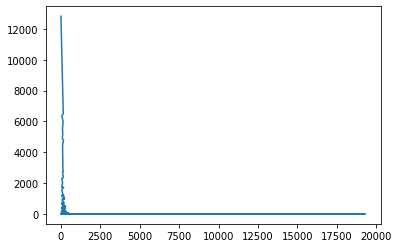

kilometer的特征分布如下：
kilometer特征有个13不同的值
15.0    96877
12.5    15722
10.0     6459
9.0      5257
8.0      4573
7.0      4084
6.0      3725
5.0      3144
4.0      2718
3.0      2501
2.0      2354
0.5      1840
1.0       746
Name: kilometer, dtype: int64


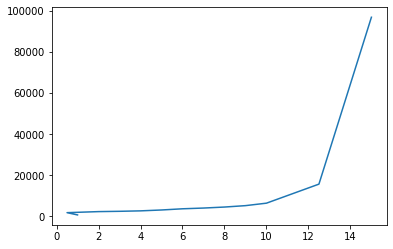

v_0的特征分布如下：
v_0特征有个143997不同的值
45.349115    20
48.087217    16
47.568450    15
48.618150    15
47.840357    15
48.251430    15
48.433440    14
47.802989    14
48.265907    14
47.666444    12
46.715589    12
48.285575    11
48.038450    11
47.730567    11
49.130026    11
Name: v_0, dtype: int64


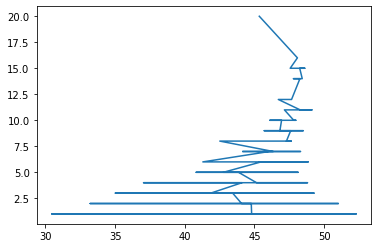

v_1的特征分布如下：
v_1特征有个143998不同的值
-3.245133    20
 3.183323    16
 1.942732    15
 3.354949    15
 2.796739    15
 3.116688    15
 2.886858    14
 3.396244    14
 3.195363    14
 3.400295    12
 3.196137    12
-3.276149    11
 2.942478    11
 3.286442    11
 3.886811    11
Name: v_1, dtype: int64


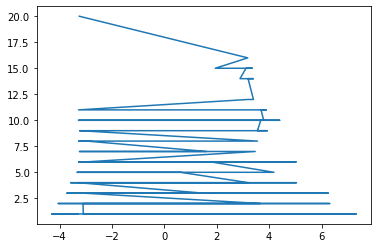

v_2的特征分布如下：
v_2特征有个143997不同的值
-0.349860    20
 0.826577    16
 0.887762    15
-0.158364    15
 0.980616    15
 0.030708    15
-0.028164    14
-0.128923    14
 0.985872    14
 0.470569    12
 0.957996    12
 0.433969    11
 0.790099    11
 1.237943    11
-0.251471    11
Name: v_2, dtype: int64


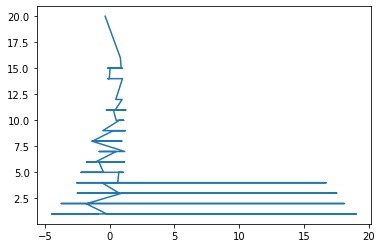

v_3的特征分布如下：
v_3特征有个143998不同的值
-0.218201    20
-1.312990    16
-2.006612    15
-1.619873    15
-1.612432    15
-1.382756    15
-1.881850    14
-1.713509    14
-1.690953    14
-1.199488    12
-1.562650    12
-1.753103    11
-2.133162    11
-2.826999    11
-1.661522    11
Name: v_3, dtype: int64


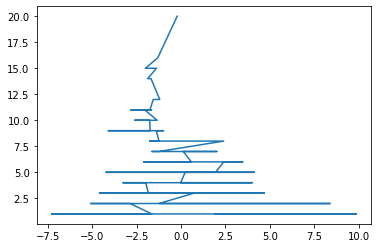

v_4的特征分布如下：
v_4特征有个143998不同的值
-1.626828    20
 0.696775    16
-0.365900    15
-0.364986    15
-0.379815    15
 1.235458    15
 1.617136    14
-0.304815    14
-0.393283    14
-0.291029    12
 1.425915    12
-0.162278    11
-0.232889    11
 2.228813    11
 0.415740    11
Name: v_4, dtype: int64


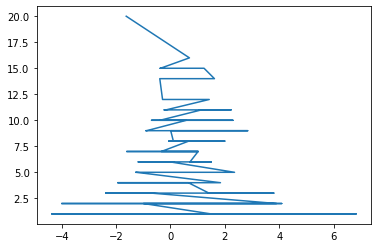

v_5的特征分布如下：
v_5特征有个139624不同的值
0.000000    4485
0.269406      20
0.256226      16
0.261082      15
0.277097      15
0.260996      15
0.265764      15
0.263126      14
0.260631      14
0.277397      14
0.248365      12
0.260139      12
0.259405      11
0.276148      11
0.266561      11
Name: v_5, dtype: int64


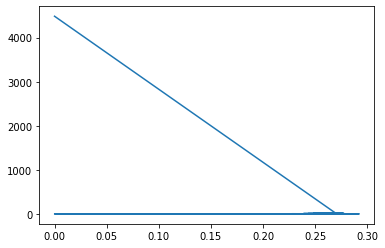

v_6的特征分布如下：
v_6特征有个109766不同的值
0.000000    35465
0.000053       20
0.093472       16
0.075212       15
0.087562       15
0.095029       15
0.091887       15
0.095452       14
0.088704       14
0.092853       14
0.096198       12
0.091814       12
0.000908       11
0.089989       11
0.099076       11
Name: v_6, dtype: int64


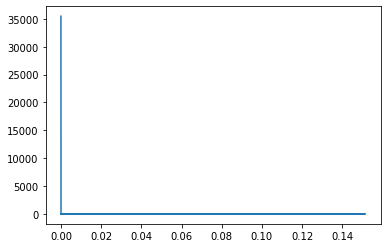

v_7的特征分布如下：
v_7特征有个138709不同的值
0.000000    5467
0.124213      20
0.130272      16
0.139667      15
0.051680      15
0.081595      15
0.140907      15
0.140865      14
0.072930      14
0.045171      14
0.090566      12
0.146413      12
0.142647      11
0.076363      11
0.089698      11
Name: v_7, dtype: int64


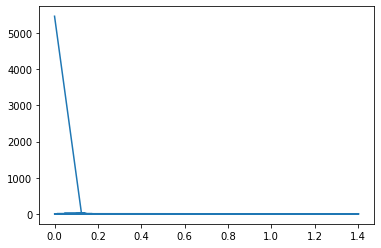

v_8的特征分布如下：
v_8特征有个142451不同的值
0.000000    1597
0.067358      20
0.074742      16
0.073268      15
0.075905      15
0.076664      15
0.084696      15
0.078658      14
0.080584      14
0.075376      14
0.070732      12
0.076595      12
0.079611      11
0.108396      11
0.082419      11
Name: v_8, dtype: int64


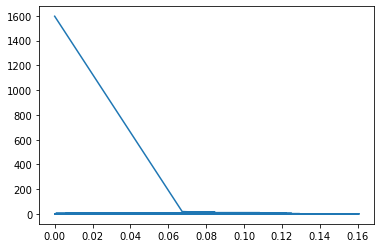

v_9的特征分布如下：
v_9特征有个140617不同的值
0.000000    3486
0.014867      20
0.082765      16
0.101150      15
0.051535      15
0.045877      15
0.046765      15
0.049611      14
0.048203      14
0.110887      14
0.049351      12
0.101553      12
0.097584      11
0.051700      11
0.068842      11
Name: v_9, dtype: int64


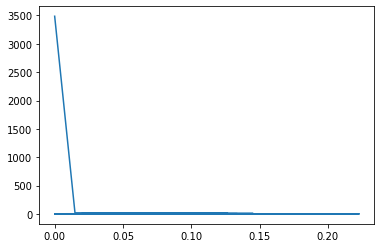

v_10的特征分布如下：
v_10特征有个143997不同的值
 2.329386    20
-4.303481    16
-3.163236    15
-4.757359    15
-4.383929    15
-4.047400    15
-4.686442    14
-3.950857    14
-4.815884    14
-3.877387    12
-4.294578    12
 1.392127    11
-4.707804    11
-5.014061    11
-4.502966    11
Name: v_10, dtype: int64


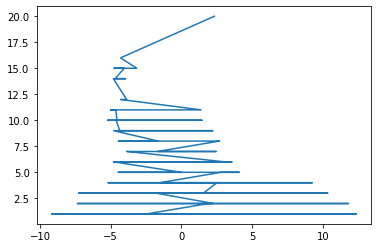

v_11的特征分布如下：
v_11特征有个143997不同的值
-2.255591    20
-0.330053    16
-1.107940    15
-0.802614    15
-1.436494    15
-0.079872    15
-1.229806    14
-1.124892    14
-0.305946    14
 0.095870    12
 0.089037    12
-3.271947    11
-1.558404    11
-0.037064    11
 0.022774    11
Name: v_11, dtype: int64


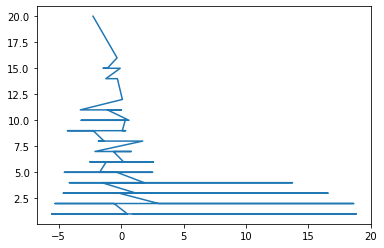

v_12的特征分布如下：
v_12特征有个143997不同的值
0.847433    20
2.486297    16
2.375256    15
3.097963    15
2.104470    15
2.515777    15
2.769740    14
2.387382    14
2.260273    14
2.291054    12
1.787983    12
4.129080    11
1.992162    11
3.143840    11
1.970922    11
Name: v_12, dtype: int64


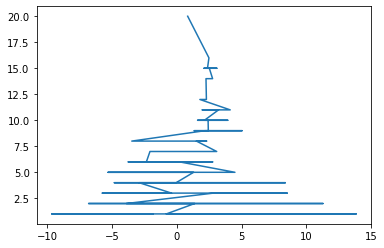

v_13的特征分布如下：
v_13特征有个143998不同的值
-1.698497    20
-0.043463    16
 0.548697    15
-0.834697    15
-0.499453    15
-0.367855    15
-0.662800    14
-0.375957    14
 1.037324    14
-0.477794    12
 1.262817    12
-0.088135    11
 0.262898    11
-0.710434    11
 0.598188    11
Name: v_13, dtype: int64


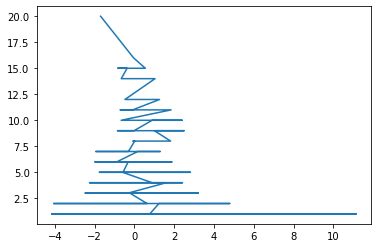

v_14的特征分布如下：
v_14特征有个143998不同的值
 0.003015    20
-2.290344    16
-3.059444    15
 1.027487    15
 0.869586    15
-1.330412    15
-0.550826    14
-2.488781    14
 0.979706    14
 1.162448    12
-0.609325    12
-2.554334    11
-1.245063    11
-1.796386    11
 0.805444    11
Name: v_14, dtype: int64


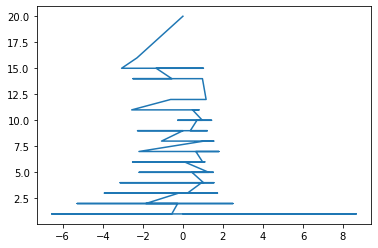

In [181]:
# 定量数据unique分布
for num_fea in numeric_features:
    print(num_fea + "的特征分布如下：")
    print("{}特征有个{}不同的值".format(num_fea, Train_data[num_fea].nunique()))
    print(Train_data[num_fea].value_counts().head(15))
    Train_data[num_fea].value_counts().plot()
    plt.show()

### 0.4.b numeric_features分析

In [182]:
# 相关性分析
numeric_feature_cor = numeric_features+['price']
price_num = Train_data[numeric_feature_cor]
correlation = abs(price_num.corr())
correlation

,power,kilometer,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14,price
power,1.000000,0.019631,0.215028,0.023746,0.031487,0.185342,0.141013,0.119727,0.025648,0.060397,0.155956,0.140203,0.092717,0.122107,0.161990,0.103430,0.023808,0.219834
kilometer,0.019631,1.000000,0.225034,0.022228,0.110375,0.402502,0.214861,0.049502,0.024664,0.017835,0.407686,0.149422,0.083358,0.066542,0.370153,0.285158,0.120389,0.440519
v_0,0.215028,0.225034,1.000000,0.245049,0.452591,0.710480,0.259714,0.726250,0.243783,0.584363,0.514149,0.186243,0.582943,0.667809,0.415711,0.136938,0.039809,0.628397
v_1,0.023746,0.022228,0.245049,1.000000,0.001133,0.001915,0.000468,0.109303,0.999415,0.110806,0.298966,0.007698,0.921904,0.370445,0.087593,0.017349,0.002143,0.060914
v_2,0.031487,0.110375,0.452591,0.001133,1.000000,0.001224,0.001021,0.921857,0.023877,0.973689,0.180285,0.236164,0.274341,0.800915,0.535270,0.055376,0.013785,0.085322
v_3,0.185342,0.402502,0.710480,0.001915,0.001224,1.000000,0.001694,0.233412,0.000747,0.191278,0.933161,0.079292,0.247385,0.429777,0.811301,0.246052,0.058561,0.730946
v_4,0.141013,0.214861,0.259714,0.000468,0.001021,0.001694,1.000000,0.259739,0.011275,0.054241,0.051741,0.962928,0.071116,0.110660,0.134611,0.934580,0.178518,0.147085
v_5,0.119727,0.049502,0.726250,0.109303,0.921857,0.233412,0.259739,1.000000,0.091229,0.939385,0.010686,0.050343,0.440588,0.845954,0.258521,0.162689,0.037804,0.164317
v_6,0.025648,0.024664,0.243783,0.999415,0.023877,0.000747,0.011275,0.091229,1.000000,0.085410,0.294956,0.023057,0.917056,0.386446,0.070238,0.000758,0.003322,0.068970
v_7,0.060397,0.017835,0.584363,0.110806,0.973689,0.191278,0.054241,0.939385,0.085410,1.000000,0.028695,0.264091,0.410014,0.813175,0.385378,0.154535,0.020218,0.053024


In [183]:
# 找出相关性大的几个特征
correlation[correlation>0.9]

,power,kilometer,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14,price
power,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
kilometer,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v_0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v_1,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,0.999415,NaN,NaN,NaN,0.921904,NaN,NaN,NaN,NaN,NaN
v_2,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.921857,NaN,0.973689,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v_3,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,0.933161,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v_4,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,0.962928,NaN,NaN,NaN,0.93458,NaN,NaN
v_5,NaN,NaN,NaN,NaN,0.921857,NaN,NaN,1.000000,NaN,0.939385,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v_6,NaN,NaN,NaN,0.999415,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.917056,NaN,NaN,NaN,NaN,NaN
v_7,NaN,NaN,NaN,NaN,0.973689,NaN,NaN,0.939385,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [184]:
print(correlation['price'].sort_values(ascending = False))

price        1.000000
v_3          0.730946
v_12         0.692823
v_8          0.685798
v_0          0.628397
kilometer    0.440519
v_11         0.275320
v_10         0.246175
power        0.219834
v_9          0.206205
v_5          0.164317
v_4          0.147085
v_2          0.085322
v_6          0.068970
v_1          0.060914
v_7          0.053024
v_14         0.035911
v_13         0.013993
Name: price, dtype: float64


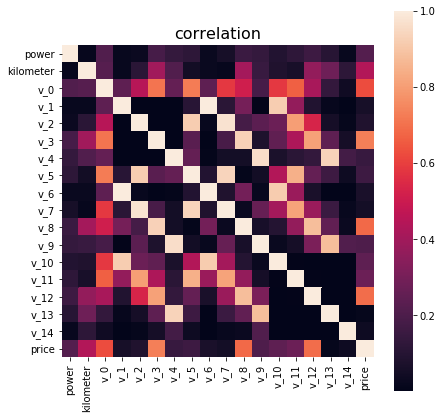

In [185]:
# 后面算法模型的基本假设条件：特征之间是相互独立的,
# 所以在特征工程的时候可以删除掉相关性大的特征中的一个
f, ax = plt.subplots(figsize = (7,7))
plt.title("correlation",y=1,size=16)
sns.heatmap(correlation,square=True,vmax=1.0)

In [186]:
# 查看几个特征得 偏度和峰值
# 这里为什么要查看偏度和峰度？？？？
for col in numeric_features:
    print('{:15}'.format(col), 
          'Skewness: {:05.2f}'.format(Train_data[col].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(Train_data[col].kurt())  
         )

power           Skewness: 65.86     Kurtosis: 5733.45
kilometer       Skewness: -1.53     Kurtosis: 001.14
v_0             Skewness: -1.32     Kurtosis: 003.99
v_1             Skewness: 00.36     Kurtosis: -01.75
v_2             Skewness: 04.84     Kurtosis: 023.86
v_3             Skewness: 00.11     Kurtosis: -00.42
v_4             Skewness: 00.37     Kurtosis: -00.20
v_5             Skewness: -4.74     Kurtosis: 022.93
v_6             Skewness: 00.37     Kurtosis: -01.74
v_7             Skewness: 05.13     Kurtosis: 025.85
v_8             Skewness: 00.20     Kurtosis: -00.64
v_9             Skewness: 00.42     Kurtosis: -00.32
v_10            Skewness: 00.03     Kurtosis: -00.58
v_11            Skewness: 03.03     Kurtosis: 012.57
v_12            Skewness: 00.37     Kurtosis: 000.27
v_13            Skewness: 00.27     Kurtosis: -00.44
v_14            Skewness: -1.19     Kurtosis: 002.39


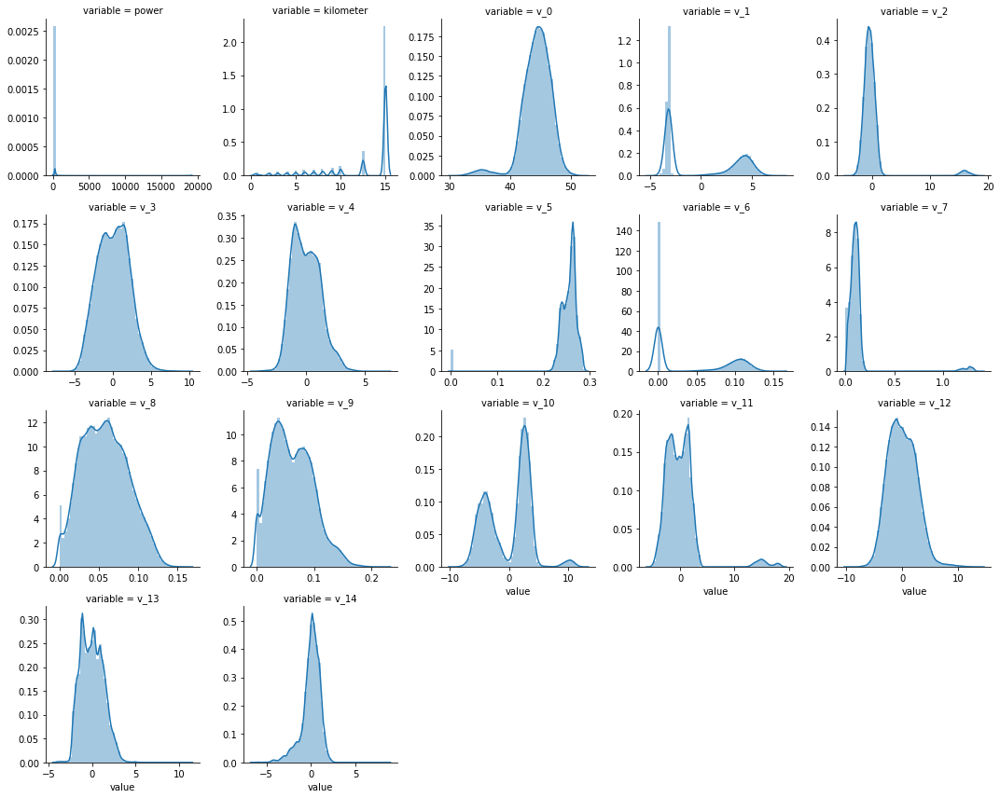

In [187]:
## 3) 每个数字特征得分布可视化，可能是概率密度函数？？？待查证
f = pd.melt(Train_data, value_vars=numeric_features)
g = sns.FacetGrid(f, col="variable",  col_wrap=5, sharex=False, sharey=False)
g = g.map(sns.distplot, "value")

In [188]:
## 4) 数字特征相互之间的关系可视化，无法画出
# sns.set()
# columns = ['price', 'v_12', 'v_8' , 'v_0', 'power', 'v_5',  'v_2', 'v_6', 'v_1', 'v_14']
# sns.pairplot(Train_data[columns],size = 2 ,kind ='scatter',diag_kind='kde')
# plt.show()

### 0.4.c categorical_features分析

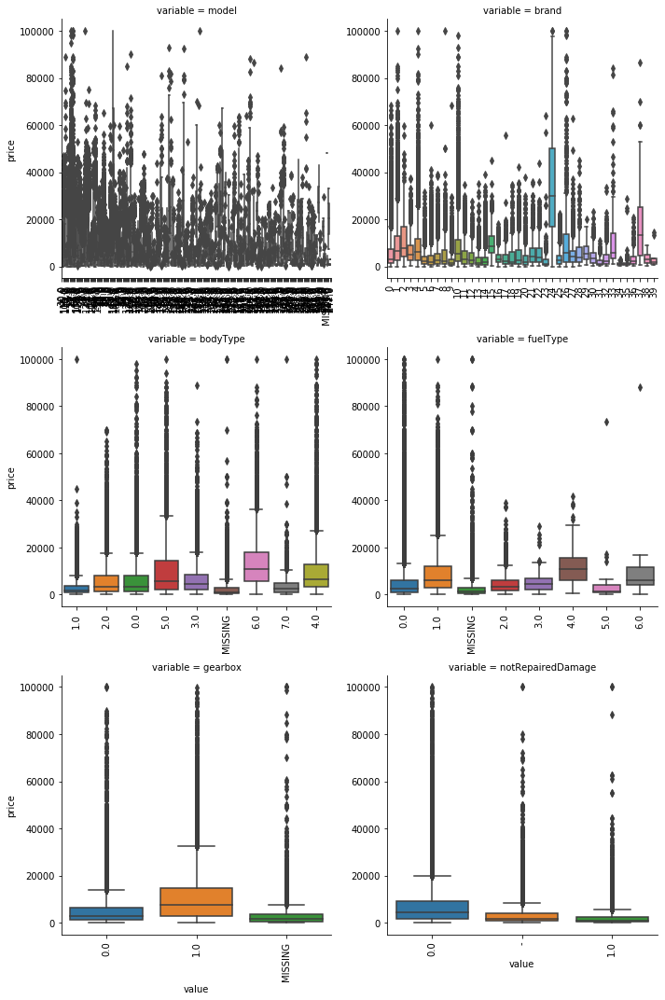

In [189]:
## 2) 箱形图
# 因为 name和 regionCode的类别太稀疏了，这里我们把不稀疏的几类画一下
categorical_features_box = ['model',
 'brand',
 'bodyType',
 'fuelType',
 'gearbox',
 'notRepairedDamage']
# 将缺失值也画出
Train_data_a = Train_data.copy()
for c in categorical_features_box:
    Train_data_a[c] = Train_data_a[c].astype('category')
    if Train_data_a[c].isnull().any():
        Train_data_a[c] = Train_data_a[c].cat.add_categories(['MISSING'])
        Train_data_a[c] = Train_data_a[c].fillna('MISSING')

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

f = pd.melt(Train_data_a, id_vars=['price'], value_vars=categorical_features_box)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "price")

# 1.特征工程  
通过EDA发现   
notRepairedDamage为object类型,这个比较奇特   
seller和offerType值的类型单一   
train缺失值:bodyType, fuelType, gearbox   
缺失值处理，分类特征填充众数，连续特征填充平均值。  
power范围0~600,最大值确实19000,而且power为0还能卖钱是什么鬼???   
   
train_x、train_y、test

## 1.1异常值处理

去除'seller','offerType'，单独保留price

In [190]:
# 删除数值单一
x_feature = [x for x in Train_data.columns if x not in ['seller','offerType','price']]
# 提取预测值
y_feature = 'price'
train_x = Train_data[x_feature]
train_y = Train_data[y_feature]
test = Test_data[x_feature]

notRepairedDamage处理

In [191]:
train_x['notRepairedDamage'].value_counts()

0.0    111361
-       24324
1.0     14315
Name: notRepairedDamage, dtype: int64

In [192]:
test['notRepairedDamage'].value_counts()

0.0    37249
-       8031
1.0     4720
Name: notRepairedDamage, dtype: int64

In [193]:
train_x['notRepairedDamage'].replace('-',np.nan,inplace=True)
test['notRepairedDamage'].replace('-',np.nan,inplace=True)

power处理  
题目中power的范围是0～600,但是EDA发现power最大为20000 采用长尾截断处理

In [194]:
train_x['power'] = train_x['power'].map(lambda x: 600 if x>600 else x)
test['power'] = test['power'].map(lambda x: 600 if x>600 else x)

## 1.2缺失值填充

缺失值统计  
'bodyType','fuelType','gearbox','notRepairedDamage'这几个字段存在缺失值

In [195]:
train_x.isnull().sum()

SaleID                   0
name                     0
regDate                  0
model                    1
brand                    0
bodyType              4506
fuelType              8680
gearbox               5981
power                    0
kilometer                0
notRepairedDamage    24324
regionCode               0
creatDate                0
v_0                      0
v_1                      0
v_2                      0
v_3                      0
v_4                      0
v_5                      0
v_6                      0
v_7                      0
v_8                      0
v_9                      0
v_10                     0
v_11                     0
v_12                     0
v_13                     0
v_14                     0
dtype: int64

In [196]:
test.isnull().sum()

SaleID                  0
name                    0
regDate                 0
model                   0
brand                   0
bodyType             1413
fuelType             2893
gearbox              1910
power                   0
kilometer               0
notRepairedDamage    8031
regionCode              0
creatDate               0
v_0                     0
v_1                     0
v_2                     0
v_3                     0
v_4                     0
v_5                     0
v_6                     0
v_7                     0
v_8                     0
v_9                     0
v_10                    0
v_11                    0
v_12                    0
v_13                    0
v_14                    0
dtype: int64

In [197]:
fillna_features = ['bodyType','fuelType','gearbox','notRepairedDamage']

In [198]:
# 分类特征使用众数填充
for i in fillna_features+['model']:
    train_x[i] = train_x[i].fillna(train_x[i].mode()[0])
    test[i] = test[i].fillna(train_x[i].mode()[0])

In [199]:
train_x.isnull().sum()


SaleID               0
name                 0
regDate              0
model                0
brand                0
bodyType             0
fuelType             0
gearbox              0
power                0
kilometer            0
notRepairedDamage    0
regionCode           0
creatDate            0
v_0                  0
v_1                  0
v_2                  0
v_3                  0
v_4                  0
v_5                  0
v_6                  0
v_7                  0
v_8                  0
v_9                  0
v_10                 0
v_11                 0
v_12                 0
v_13                 0
v_14                 0
dtype: int64

In [200]:
test.isnull().sum()

SaleID               0
name                 0
regDate              0
model                0
brand                0
bodyType             0
fuelType             0
gearbox              0
power                0
kilometer            0
notRepairedDamage    0
regionCode           0
creatDate            0
v_0                  0
v_1                  0
v_2                  0
v_3                  0
v_4                  0
v_5                  0
v_6                  0
v_7                  0
v_8                  0
v_9                  0
v_10                 0
v_11                 0
v_12                 0
v_13                 0
v_14                 0
dtype: int64

## 1.3分桶  
为什么要分桶？？  
数据分桶是一种数据预处理技术，用于减少次要观察误差的影响，是一种将多个连续值分组为较少数量的“桶”的方法。

In [201]:
train_x['power_bin'] = pd.cut(train_x['power'], 30, labels=False)
test['power_bin'] = pd.cut(test['power'], 30, labels=False)

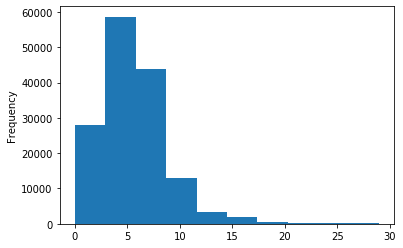

In [202]:
train_x['power_bin'].plot.hist()

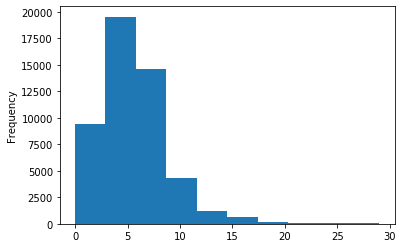

In [203]:
test['power_bin'].plot.hist()

In [204]:
train_x[['power','power_bin']]

,power,power_bin
0,60,2
1,0,0
2,163,8
3,193,9
4,68,3
...,...,...
149995,163,8
149996,125,6
149997,90,4
149998,156,7


## 1.4构造特征

构造使用时间

In [ ]:
# 构造使用时间
from datetime import datetime
def date_process(x):
    year = int(str(x)[:4])
    month = int(str(x)[4:6])
    day = int(str(x)[6:8])

    if month < 1:
        month = 1
    date = datetime(year,month,day)
    return date

In [ ]:
train_x['regDate'] = train_x['regDate'].apply(date_process)
train_x['creatDate'] = train_x['creatDate'].apply(date_process)
train_x['used_time'] = (train_x['creatDate']-train_x['regDate']).dt.days

In [ ]:
test['regDate'] = test['regDate'].apply(date_process)
test['creatDate'] = test['creatDate'].apply(date_process)
test['used_time'] = (test['creatDate']-test['regDate']).dt.days

城市特征

In [ ]:
# 城市特征
train_x['city'] = train_x['regionCode'].apply(lambda x : str(x)[:-3])

In [ ]:
test['city'] = test['regionCode'].apply(lambda x : str(x)[:-3])

统计量特征  
对于model、brand为类别特征，但是这两个太的种类太多了，不利于one_hot编码，可以使用统计量创造新的特征。

In [ ]:
# 统计量特征
Train_gb = Train_data.groupby("brand")
all_info = {}
for kind, kind_data in Train_gb:
    info = {}
    kind_data = kind_data[kind_data['price'] > 0]
    # 这项统计数据用在test数据集不适合,因为这是train数据集的统计值
    # info['brand_amount'] = len(kind_data) 
    info['brand_price_max'] = kind_data.price.max()
    info['brand_price_median'] = kind_data.price.median()
    info['brand_price_min'] = kind_data.price.min()
    info['brand_price_sum'] = kind_data.price.sum()
    info['brand_price_std'] = kind_data.price.std()
    info['brand_price_average'] = round(kind_data.price.sum() / (len(kind_data) + 1), 2)
    all_info[kind] = info
brand_fe = pd.DataFrame(all_info).T.reset_index().rename(columns={"index": "brand"})

In [ ]:
train_x = train_x.merge(brand_fe, how='left', on='brand')
test = test.merge(brand_fe, how='left', on='brand')

In [ ]:
train_x.head()

In [ ]:
# 统计量特征
Train_gm = Train_data.groupby("model")
all_info = {}
for kind, kind_data in Train_gm:
    info = {}
    kind_data = kind_data[kind_data['price'] > 0]
    # 这项统计数据用在test数据集不适合,因为这是train数据集的统计值
    # info['model_amount'] = len(kind_data) 
    info['model_price_max'] = kind_data.price.max()
    info['model_price_median'] = kind_data.price.median()
    info['model_price_min'] = kind_data.price.min()
    info['model_price_sum'] = kind_data.price.sum()
    info['model_price_std'] = kind_data.price.std()
    info['model_price_average'] = round(kind_data.price.sum() / (len(kind_data) + 1), 2)
    all_info[kind] = info
model_fe = pd.DataFrame(all_info).T.reset_index().rename(columns={"index": "model"})

In [ ]:
# 在计算model_price_std时出现nan, 当model=247时，只有一条记录，所以model_price_std=nan
model_fe = model_fe.fillna(0)

In [ ]:
train_x = train_x.merge(model_fe, how='left', on='model')
test = test.merge(model_fe, how='left', on='model')

## 1.5定量数据归一化+定性数据编码

In [ ]:
train_x.columns

In [ ]:
# 归一化函数
def max_min(x):
    return (x-np.min(x))/(np.max(x)-np.min(x))

In [ ]:
numeric_features = numeric_features +['brand_price_max','brand_price_median','brand_price_min','brand_price_sum','brand_price_std','brand_price_average']+['model_price_max','model_price_median','model_price_min','model_price_sum','model_price_std','model_price_average']
# numeric_features = numeric_features + ['used_time']

In [ ]:
for num_fea in numeric_features:
    train_x[num_fea] = max_min(train_x[num_fea])
    
for num_fea in numeric_features:
    test[num_fea] = max_min(test[num_fea])

one hot编码就是将一个字段进行001 010 100 这种编码

In [ ]:
# one hot定性数据
# 在编码时saleId与name不进行编码 太稀疏了吗。为什么city不进行one hot编码。为什么其他的要进行one hot编码
# cate_oht_features = ['model', 'brand', 'bodyType', 'fuelType','gearbox', 'notRepairedDamage', 'power_bin','city']
# 把'bodyType', 'fuelType','gearbox'进行转换后，训练的效果很不理想
cate_oht_features = ['bodyType', 'fuelType','gearbox', 'notRepairedDamage', 'power_bin','city']  

In [ ]:
# 自动把编码前变量删除
train_x = pd.get_dummies(train_x,columns=cate_oht_features)
test = pd.get_dummies(test,columns=cate_oht_features)

# 2.0 建模调参

给LR模型选择特征

In [ ]:
train_column = [x for x in train_x.columns if x not in ['SaleID','name','regDate','regionCode','creatDate','model','brand','power']]
train_x_lr = train_x[train_column]

In [ ]:
train_x_lr = reduce_mem_usage(train_x_lr)

In [ ]:
train_x_lr.head()

In [ ]:
# 简单建模
from sklearn.linear_model import LinearRegression
model = LinearRegression()
# normalize=True 会自动正则化，那前面的正则化不是白费了

In [ ]:
# +1是为了让函数值大于0
train_y_ln = np.log(train_y + 1)

In [ ]:
# coef_可以查看估计系数，系数越大说明模型可能过拟合。
# powe_bin是不是过于分散，步长要小点。
# bodytype、fueltype、city这些的系数都太大，处理的也不合理，
model = model.fit(train_x_lr, train_y_ln)
print('intercept:'+ str(model.intercept_) )
sorted(dict(zip(train_column, model.coef_)).items(), key=lambda x:x[1], reverse=True)

### 五折验证

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error,  make_scorer

In [ ]:
# train_x_lr
scores = cross_val_score(model, X=train_x_lr, y=train_y_ln, verbose=1, cv = 5, scoring=make_scorer(mean_absolute_error))
print('处理过标签AVG:', np.mean(scores))

In [ ]:
scores_cvlist = pd.DataFrame(scores.reshape(1,-1))
n = scores.size
scores_cvlist.columns = ['cv' + str(x) for x in range(1, n+1)]
scores_cvlist.index = ['MAE']
scores_cvlist

L1和L2正则

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso 

In [ ]:
models = [LinearRegression(),
          Ridge(),
          Lasso()]

In [ ]:
result = dict()
for model in models:
    model_name = str(model).split('(')[0]
    scores = cross_val_score(model, X=train_x_lr, y=train_y_ln, verbose=0, cv = 5, scoring=make_scorer(mean_absolute_error))
    result[model_name] = scores
    print(model_name + ' is finished')

In [ ]:
result = pd.DataFrame(result)
result.index = ['cv' + str(x) for x in range(1, 6)]
result

In [ ]:
model = LinearRegression().fit(train_x_lr, train_y_ln)
print('intercept:'+ str(model.intercept_))
plt.figure(figsize=(10, 30))
sns.barplot(abs(model.coef_), train_x_lr.columns)

In [ ]:
model = Ridge().fit(train_x_lr, train_y_ln)
print('intercept:'+ str(model.intercept_))
plt.figure(figsize=(10, 30))
sns.barplot(abs(model.coef_), train_x_lr.columns)

In [ ]:
model = Lasso().fit(train_x_lr, train_y_ln)
print('intercept:'+ str(model.intercept_))
plt.figure(figsize=(6, 30))
sns.barplot(abs(model.coef_), train_x_lr.columns)

### L1与L2正则项总结：  
为什么自己的特征工程会使Lasso正则项那么大？   
发现是used_time的原因